In [1]:
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import squidpy as sq
import pickle

In [4]:
sc.set_figure_params(dpi=100, facecolor=None, frameon=False, vector_friendly=True, transparent=True)
sc.settings._vector_friendly = False

In [5]:
# set working directory
project_dir = "/Users/cenkcelik/Cenk_scoring/"
working_dir = project_dir + ""
os.chdir(working_dir)

# set figure directory
figure_dir = working_dir + "figures/"

# processed data directory
processed_data = working_dir + "processed_data/"

In [6]:
# import a local package
import sys
sys.path.append("/Users/cenkcelik/Documents/GitHub/EnrichMap/")
import enrichmap as em

In [7]:
adata = sc.read_h5ad(processed_data + "adata_slides_0_3.h5ad")

In [8]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [9]:
upregulated_genes = [
    "CFLAR", "CALCOCO1", "YPEL3", "CST3", "SERINC1", "CLIP4", "PCYOX1", "TMEM59","RGS2", "YPEL5", "CD63", "KIAA1109", 
    "CDH13", "GSN", "MR1", "CYB5R1", "AZGP1","ZFYVE1", "DMXL1", "EPS8L2", "PTTG1IP", "MIR22HG", "PSAP", "GOLGA8B", 
    "NEAT1", "TXNIP", "MTRNR2L12"
]

downregulated_genes = [
    "NCAPD2", "PTBP1", "MPHOSPH9", "NUCKS1", "TCOF1", "SART3", "SNRPA", "KIF22", "HSP90AA1", "WBP11", "CAD", "SF3B2",
    "KHSRP", "WDR76", "NUP188", "HSP90AB1", "HNRNPM", "SMARCB1", "PNN", "RBBP7", "NPRL3", "USP10", "SGTA", "MRPL4",
    "PSMD3", "KPNB1", "CBX1", "LRRC59", "TMEM97", "NSD2", "PRPF19", "PTGES3", "CPSF6", "SRSF3", "TCERG1", "SMC4", 
    "EIF4G1", "ZNF142", "MSH6", "MRPL37", "SFPQ", "STMN1", "ARID1A", "PROSER1", "DDX39A", "EXOSC9", "USP22", "DEK",
    "DUT", "ILF3", "DNMT1", "NASP", "HMGB1P5", "SRRM1", "GNL2", "RNF138", "SRSF1", "TRA2B", "SMPD4", "ANP32B", "HMGA1",
    "MDC1", "HADH", "ARHGDIA", "PRCC", "HDGF", "SF3B4", "UBAP2L", "ILF2", "PARP1", "LBR", "CNOT9", "PPRC1", "SSRP1", 
    "CCT5", "DLAT", "HNRNPU", "LARP1", "SCAF4", "RRP1B", "RRP1", "CHCHD4", "GMPS", "RFC4", "SLBP", "PSIP1", "HNRNPK",
    "SKA3", "DIS3L", "USP39", "GPS1", "PA2G4", "HCFC1", "SLC19A1", "ETV4", "RAD23A", "DCTPP1", "RCC1", "EWSR1", "ALYREF",
    "PTMA", "HMGB1", "POM121", "MCMBP", "TEAD4", "CHAMP1", "TOP1", "PRRC2A", "RBM14", "HMGB1P6", "POM121C", "UHRF1"
]
proliferation = ["MKI67", "PCNA", "CCND1", "CCNE1", "CCNA1", "CCNB1", "MCM2", "MCM3", "MCM4", "MCM5", "MCM6", "MCM7", "H3F3A", "H3F3B"]

upregulated_genes = [gene for gene in upregulated_genes if gene in adata.var_names]
downregulated_genes = [gene for gene in downregulated_genes if gene in adata.var_names]
proliferation = [gene for gene in proliferation if gene in adata.var_names]

# dictionary for gene sets
tumour_genesets = {
    "upregulated": upregulated_genes,
    "downregulated": downregulated_genes,
    "proliferation" : proliferation,
}

In [10]:
# read in the pickled gene sets
with open("hallmarks_genelists.pkl", "rb") as f:
    cancer_hallmark_genesets = pickle.load(f)

# filter the gene sets to only include genes present in the adata object
filtered_cancer_hallmark_genesets = {}
for key, gene_list in cancer_hallmark_genesets.items():
    filtered_gene_list = [gene for gene in gene_list if gene in adata.var_names]
    filtered_cancer_hallmark_genesets[key] = filtered_gene_list

In [11]:
# length of each hallmark
for h, genes in filtered_cancer_hallmark_genesets.items():
    print(f"{h}: {len(genes)}")

H1: 1144
H2: 497
H3: 216
H4: 115
H5: 578
H6: 623
H7: 1010
H8: 274
H9: 186
H10: 1232
H11: 216
H12: 288
H13: 341


In [12]:
print("Number of upregulated genes: ", len(upregulated_genes))
print("Number of downregulated genes: ", len(downregulated_genes))
print("Number of proliferation genes: ", len(proliferation))

Number of upregulated genes:  23
Number of downregulated genes:  103
Number of proliferation genes:  14


In [13]:
# common genes in proliferation and upregulated genes
common_genes = list(set(upregulated_genes) & set(proliferation))
print("Number of common genes in proliferation and upregulated genes:", len(common_genes))

common_genes = list(set(downregulated_genes) & set(proliferation))
print("Number of common genes in proliferation and downregulated genes:", len(common_genes))

Number of common genes in proliferation and upregulated genes: 0
Number of common genes in proliferation and downregulated genes: 0


In [14]:
adata_tumour = adata[adata.obs["tumour_cells"] == 1].copy()

em.tl.score(
    adata_tumour,
    gene_set=tumour_genesets,
    batch_key="batch"
)

Scoring signatures: 100%|██████████| 3/3 [00:12<00:00,  4.19s/it]


In [15]:
# put the scores in the main adata object
scores = ["upregulated_score", "downregulated_score", "proliferation_score"]
tumour_spots = adata.obs_names.intersection(adata_tumour.obs_names)

for score in scores:
    adata.obs.loc[tumour_spots, score] = adata_tumour.obs.loc[tumour_spots, score]

In [16]:
adata.obs["G0_score"] = adata.obs["upregulated_score"] - adata.obs["downregulated_score"]

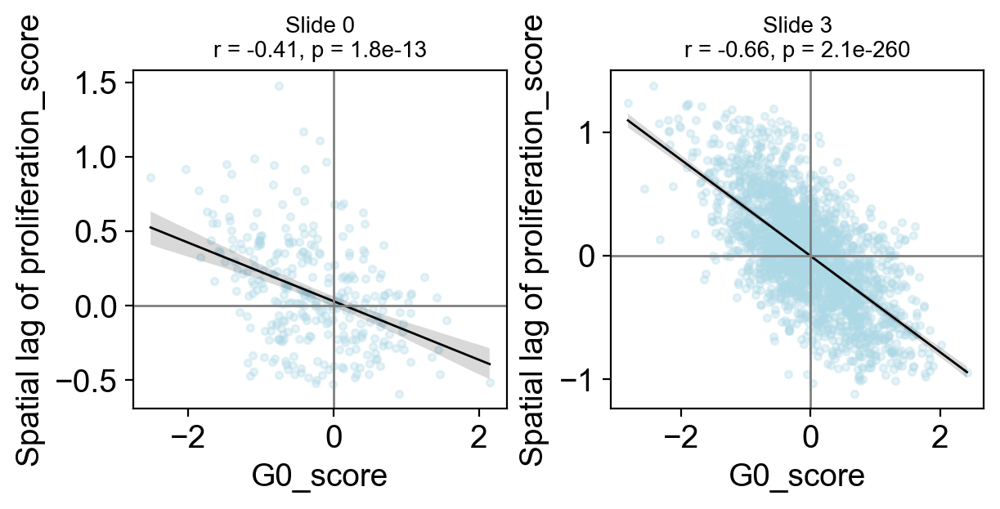

In [17]:
em.pl.cross_moran_scatter(
    adata,
    score_x="G0_score",
    score_y="proliferation_score",
    batch_key="batch",
    save="proliferation_G0_lag_cross_moran_scatter.pdf",
)

In [18]:
em.tl.score(
    adata,
    gene_set=filtered_cancer_hallmark_genesets,
    batch_key="batch"
)

Scoring signatures: 100%|██████████| 13/13 [09:23<00:00, 43.34s/it]


In [19]:
slides = ["0", "3"]

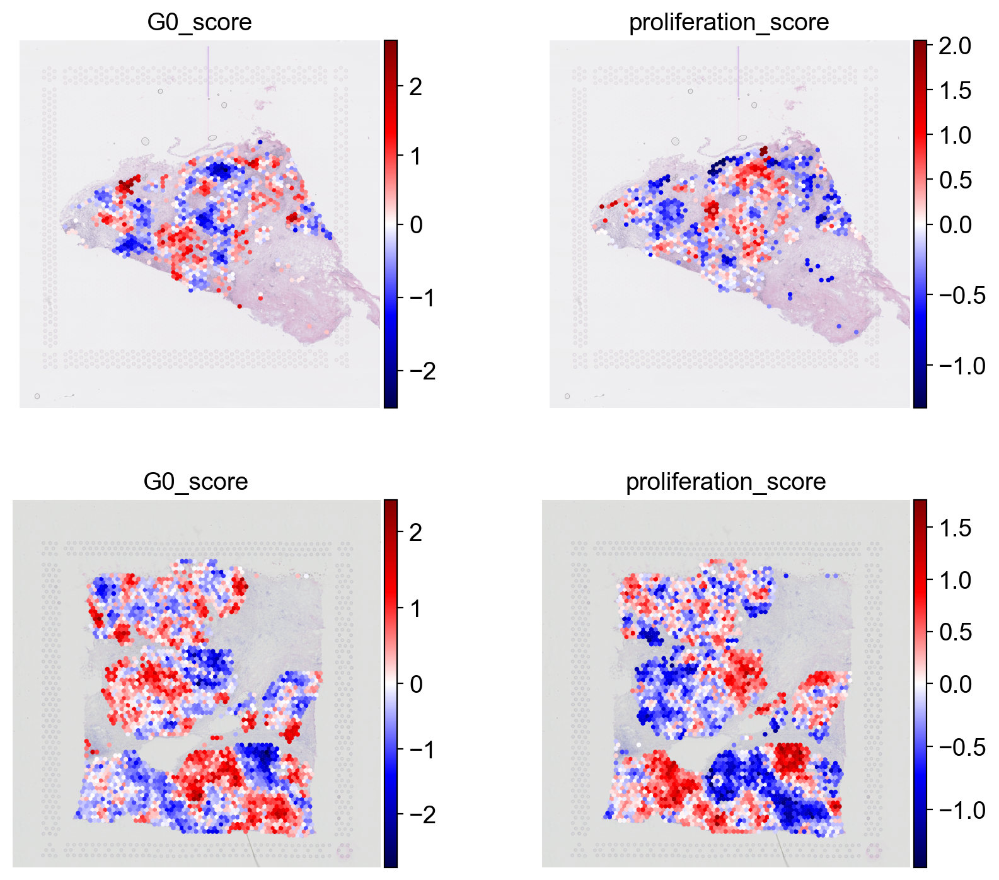

In [20]:
em.pl.spatial_enrichmap(
    adata,
    score_key=["G0_score", "proliferation_score"],
    library_key="batch",
    library_id=slides,
    cmap="seismic",
    size=1.75,
    ncols=2,
    save="G0_proliferation_enrichmap.pdf",
)

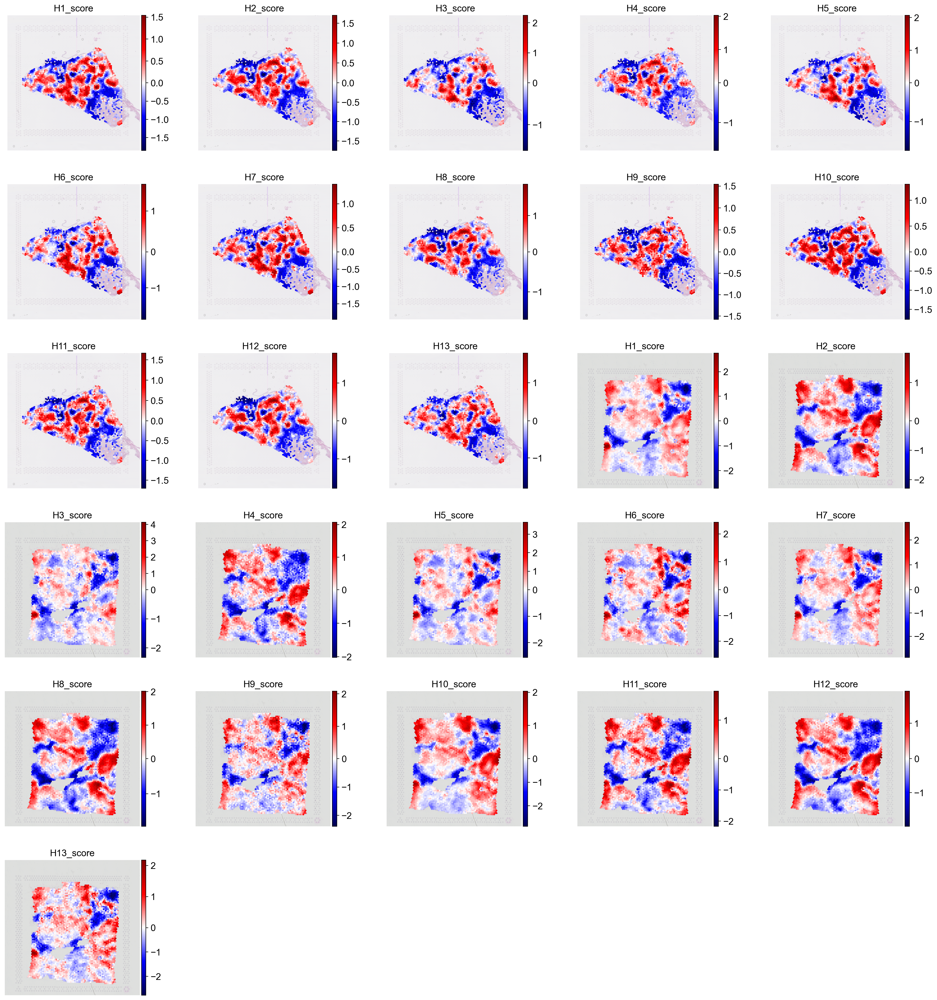

In [21]:
em.pl.spatial_enrichmap(
    adata,
    score_key=[f"{hallmark}_score" for hallmark in filtered_cancer_hallmark_genesets.keys()],
    library_key="batch",
    library_id=slides,
    cmap="seismic",
    size=1.75,
    ncols=5,
    save="hallmark_enrichmap.pdf",
)

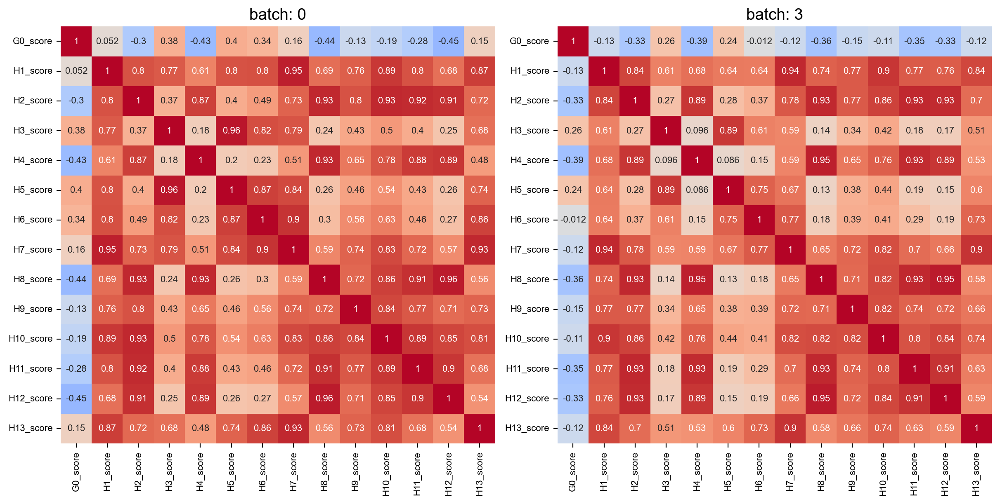

In [22]:
em.pl.signature_correlation_heatmap(
    adata,
    signatures=["G0_score"] + [f"{hallmark}_score" for hallmark in filtered_cancer_hallmark_genesets.keys()],
    batch_key="batch",
    save="G0_signature_correlation_heatmap.pdf",
)


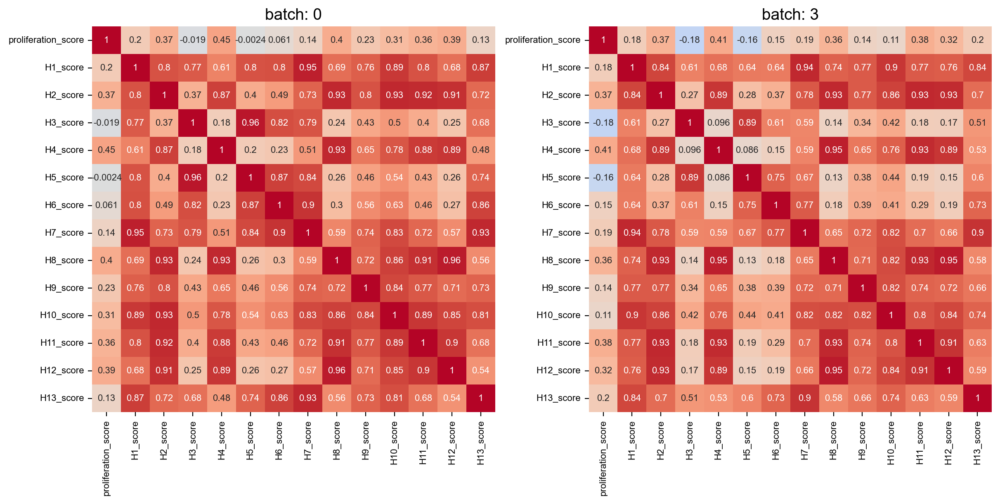

In [23]:
em.pl.signature_correlation_heatmap(
    adata,
    signatures=["proliferation_score"] + [f"{hallmark}_score" for hallmark in filtered_cancer_hallmark_genesets.keys()],
    batch_key="batch",
    save="proliferation_signature_correlation_heatmap.pdf",
)

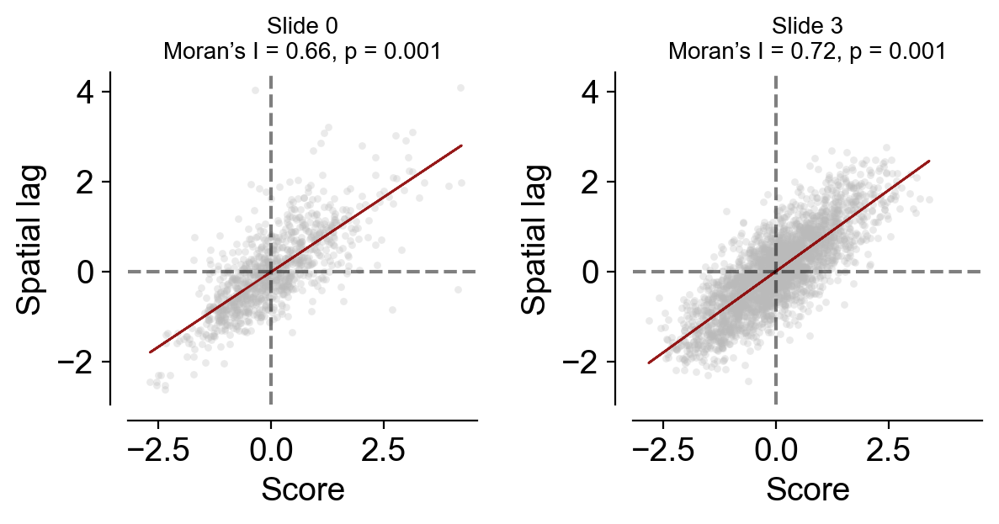

In [24]:
em.pl.morans_correlogram(
    adata,
    score_key="proliferation_score",
    library_key="batch",
    multipanel=True,
    save="proliferation_morans_correlogram.pdf",
)

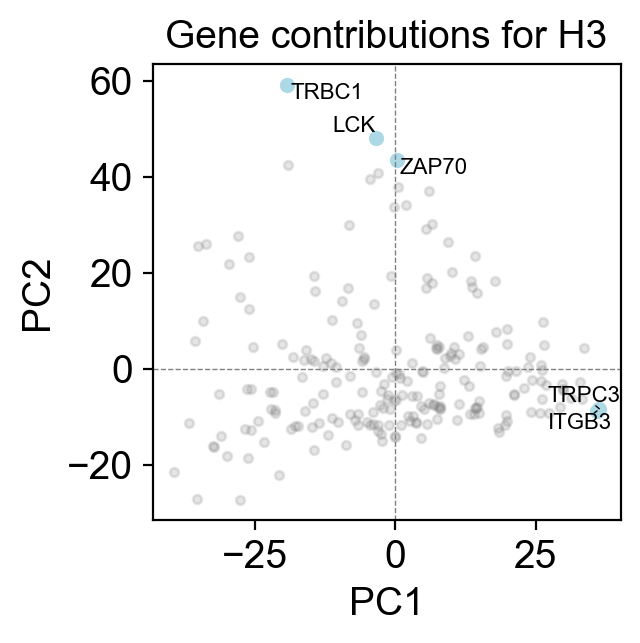

In [25]:
em.pl.gene_contributions_pca(
    adata,
    score_key="H3",
    top_n_genes=5,
    figsize=(3, 3),
    save="H3_contributions_pca.pdf",
)

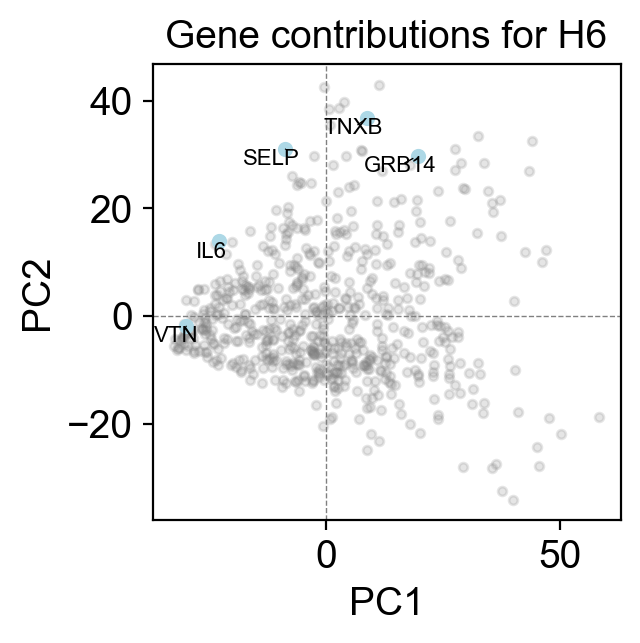

In [26]:
em.pl.gene_contributions_pca(
    adata,
    score_key="H6",
    top_n_genes=5,
    figsize=(3, 3),
    save="H6_contributions_pca.pdf",
)

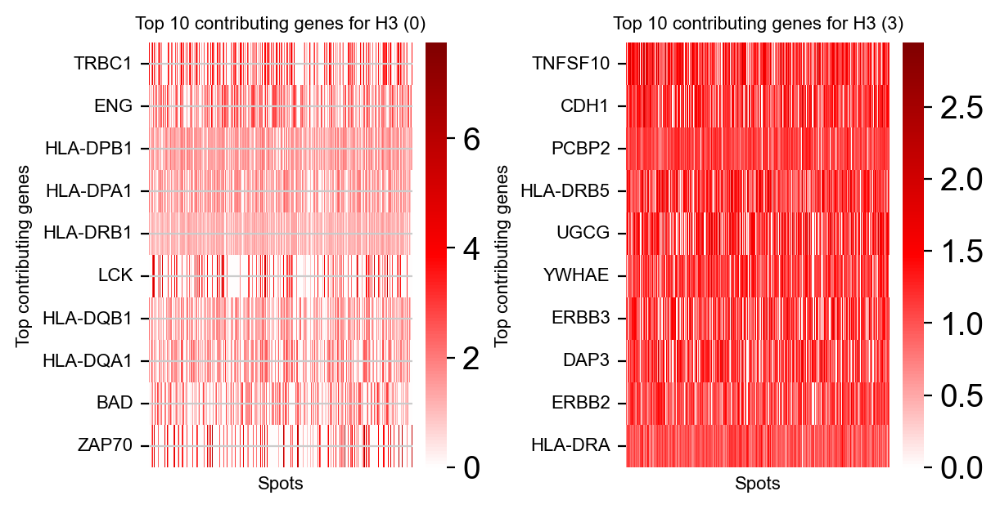

In [27]:
em.pl.gene_contributions_heatmap(
    adata,
    score_key="H3",
    top_n_genes=10,
    batch_key="batch",
    figsize=(3, 5),
    save="H3_contributions_heatmap.pdf",
)

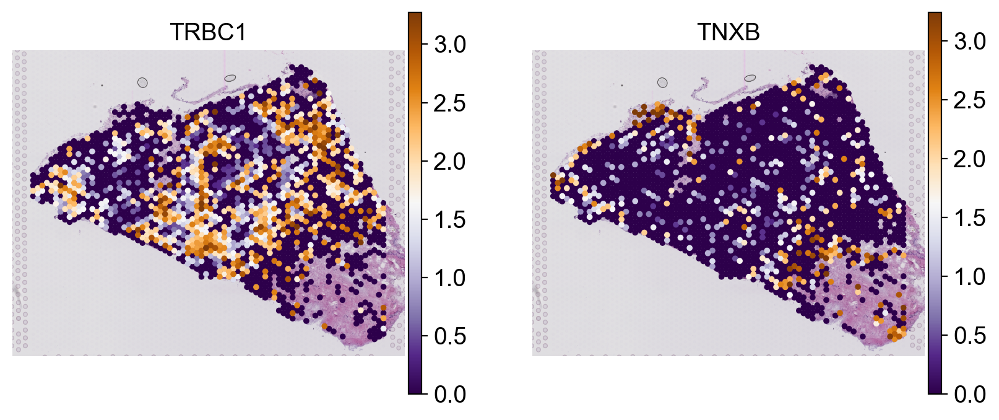

In [28]:
sc.pl.spatial(
    adata[adata.obs["batch"] == "0"],
    color=["TRBC1", "TNXB"],
    library_id="0",
    size=1.75,
    ncols=3,
    cmap="PuOr_r",
    vmax="p99.2",
    vmin=0
)

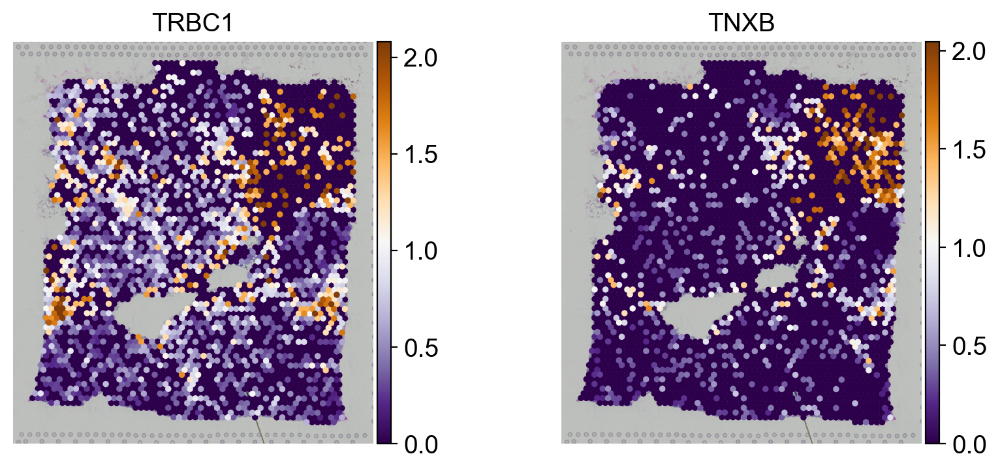

In [29]:
sc.pl.spatial(
    adata[adata.obs["batch"] == "3"],
    color=["TRBC1", "TNXB"],
    library_id="3",
    size=1.75,
    ncols=3,
    cmap="PuOr_r",
    vmax="p99.2",
    vmin=0
)

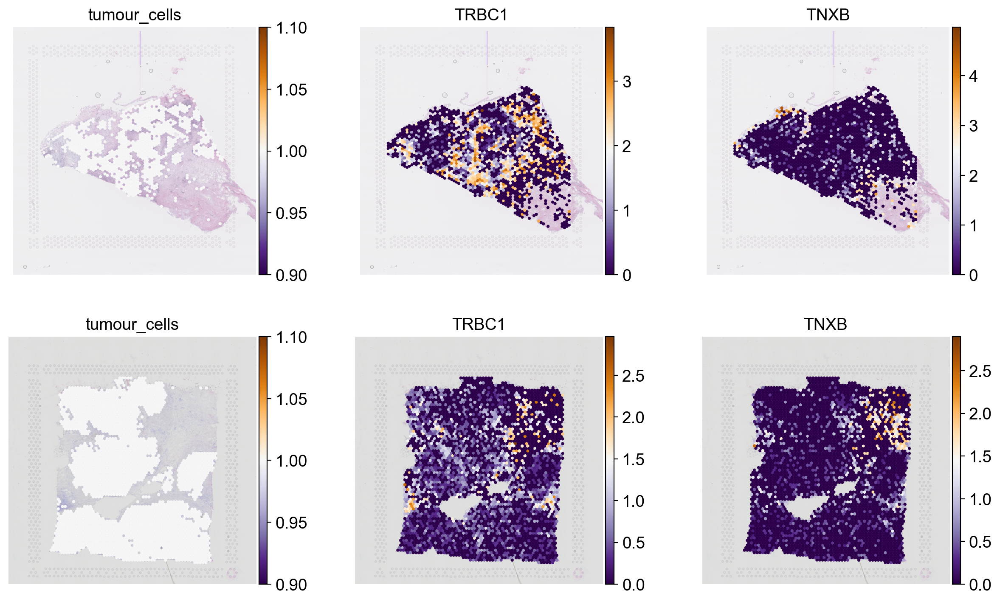

In [30]:
sq.pl.spatial_scatter(
    adata,
    color=["tumour_cells", "TRBC1", "TNXB"],
    library_key="batch",
    library_id=slides,
    size=1.75,
    ncols=3,
    img_alpha=0.5,
    cmap="PuOr_r",
    save="tumour_cells_genes.pdf",
)

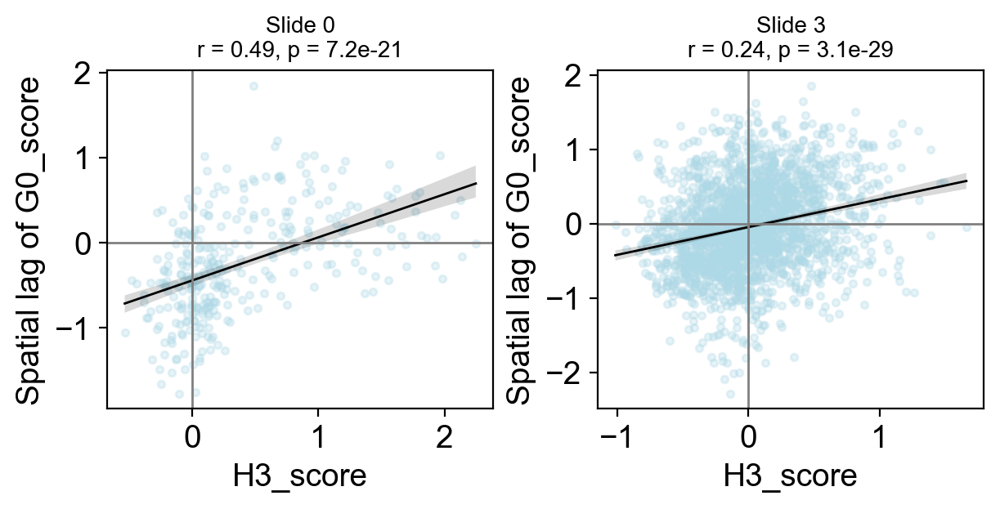

In [ ]:
em.pl.cross_moran_scatter(
    adata,
    score_x="H3_score",
    score_y="G0_score",
    batch_key="batch",
    save="H3_G0_cross_moran_scatter.pdf",
)


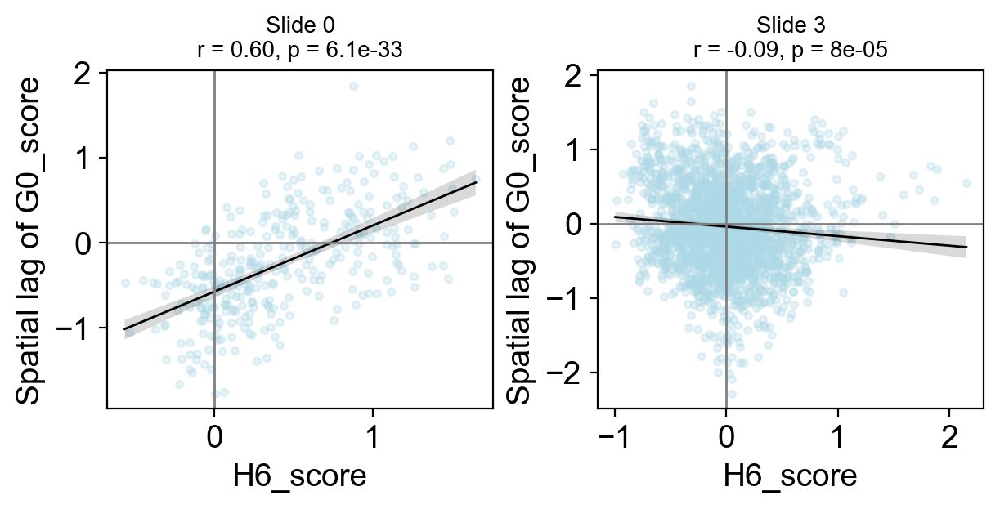

In [33]:
em.pl.cross_moran_scatter(
    adata,
    score_x="H6_score",
    score_y="G0_score",
    batch_key="batch",
    save="H6_G0_cross_moran_scatter.pdf",
)


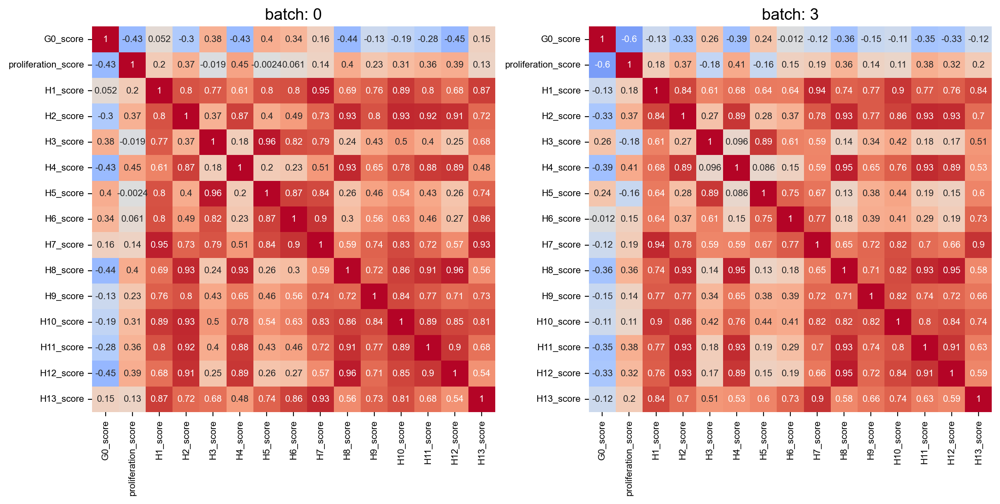

In [34]:
em.pl.signature_correlation_heatmap(
    adata,
    signatures=["G0_score", "proliferation_score"] + [f"{hallmark}_score" for hallmark in filtered_cancer_hallmark_genesets.keys()],
    batch_key="batch",
    save="G0_proliferation_signature_correlation_heatmap.pdf",
)

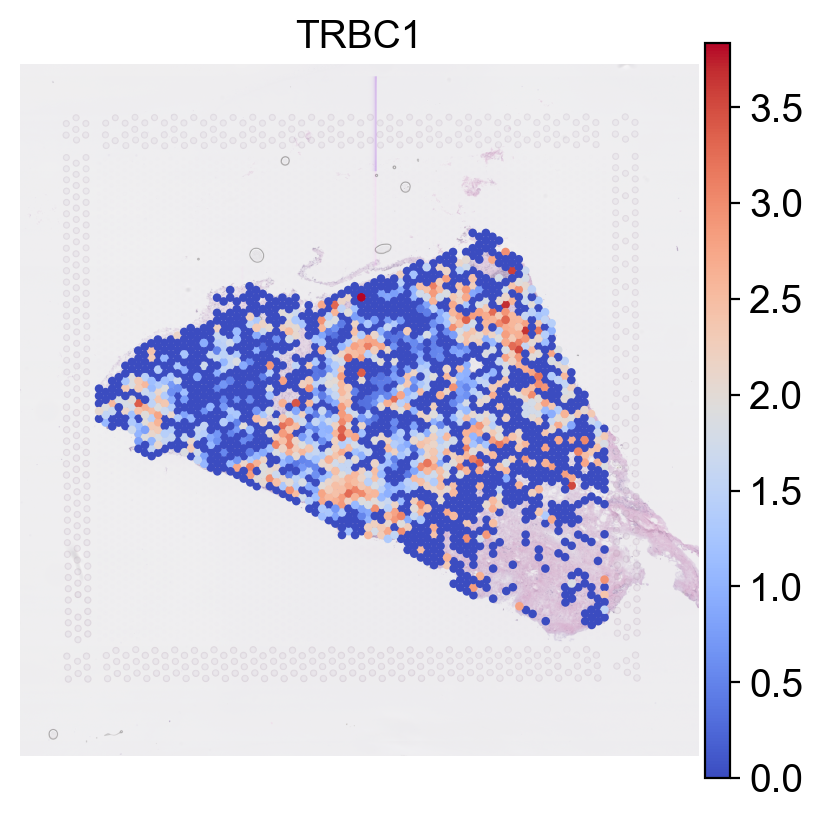

In [35]:
sq.pl.spatial_scatter(
    adata,
    color=["TRBC1"],
    library_key="batch",
    library_id=["0"],
    size=1.75,
    ncols=3,
    img_alpha=0.5,
    cmap="coolwarm",
    save="scale.pdf",
)